# Treinando a Rede de Classificação

Nessa etapa será treinado o classificador responsavel por classificar 15 tipos diferentes de roupas. Isso foi feito utilizando a rede EfficientNetB7 com o dataset [Clothes-dataset](https://www.kaggle.com/datasets/ryanbadai/clothes-dataset) disponibilizado no Kaggle.

## Obtendo os dados

O upload do arquivo `kaggle.json` deve ser feito antes de executar as células a seguir.

Instalando as dependencias para utilização do Kaggle:

In [16]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Baixando o dataset:

In [17]:
!kaggle datasets download -d ryanbadai/clothes-dataset

Dataset URL: https://www.kaggle.com/datasets/ryanbadai/clothes-dataset
License(s): MIT
100% 1.37G/1.37G [00:21<00:00, 61.8MB/s]
100% 1.37G/1.37G [00:21<00:00, 69.3MB/s]


In [ ]:
!unzip clothes-dataset.zip

Visualizando e preparando os dados para o treinamento:

In [19]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import warnings
warnings.filterwarnings('ignore')
from PIL import Image

In [20]:
base_dir='/content/Clothes_Dataset/'
clothes=os.listdir(os.path.join(base_dir))
count=0
for cloth in clothes:
    print('No of images in ' ,cloth, '', len(os.listdir(os.path.join(base_dir,cloth))))
    count+=1
print('total subfolder in dataset: ',count)

# Criando um arquivo com o nome das classes
with open('clothes.txt', 'w') as f:
    for cloth in clothes:
        f.write(cloth + '\n')

No of images in  Jaket  500
No of images in  Jaket_Olahraga  500
No of images in  Celana_Panjang  500
No of images in  Mantel  500
No of images in  Rok  500
No of images in  Polo  500
No of images in  Blazer  500
No of images in  Celana_Pendek  500
No of images in  Jeans  500
No of images in  Jaket_Denim  500
No of images in  Kaos  500
No of images in  Sweter  500
No of images in  Gaun  500
No of images in  Hoodie  500
No of images in  Kemeja  500
total subfolder in dataset:  15


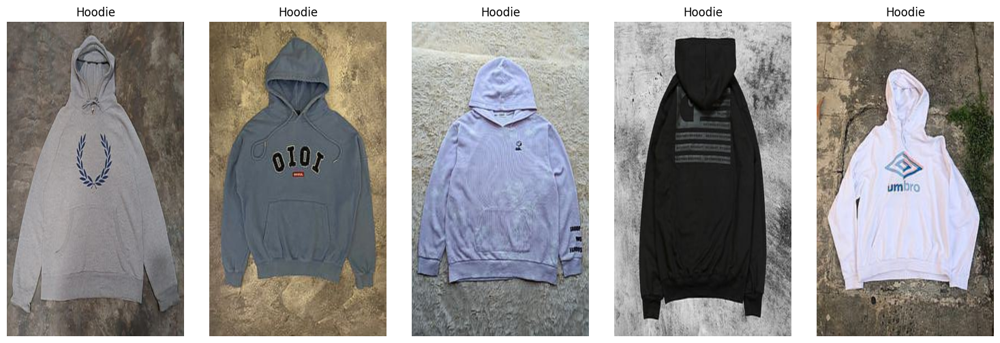

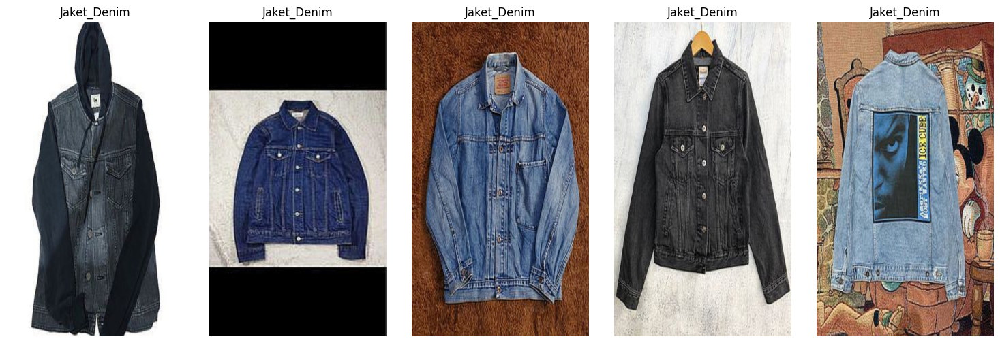

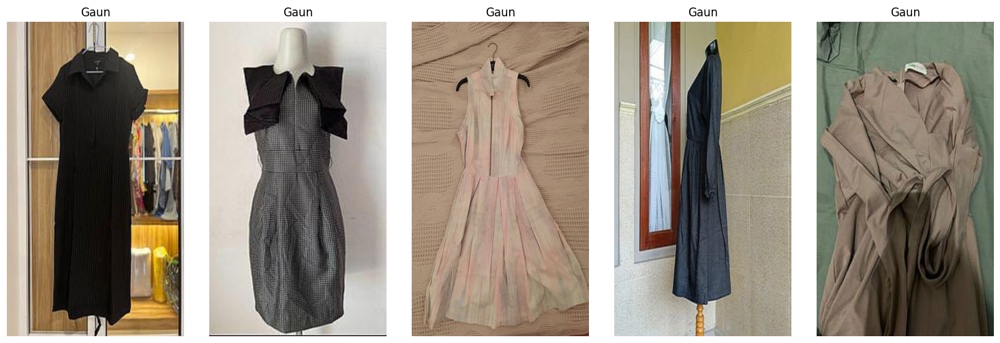

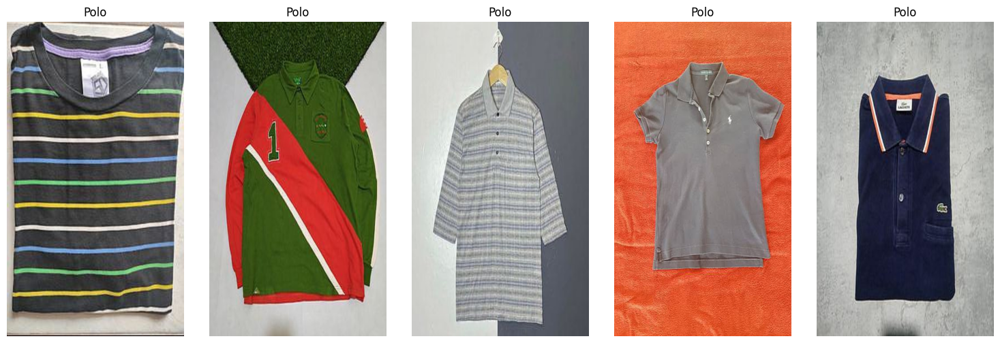

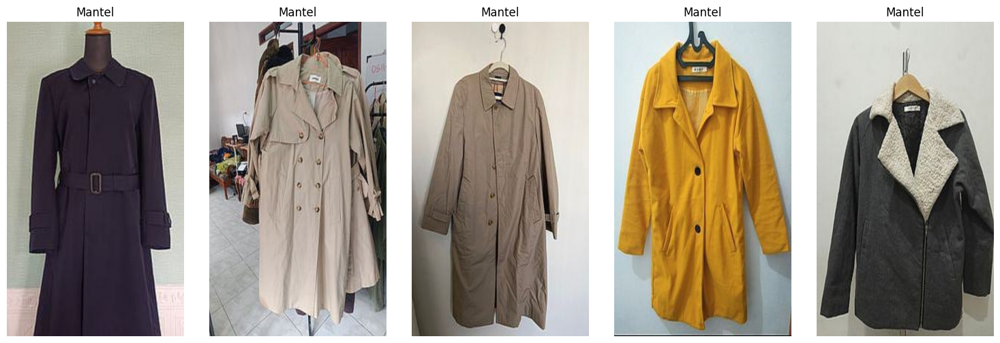

...

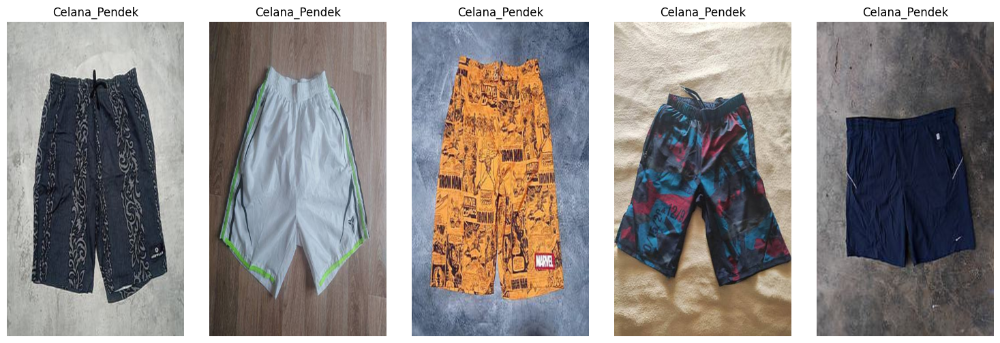

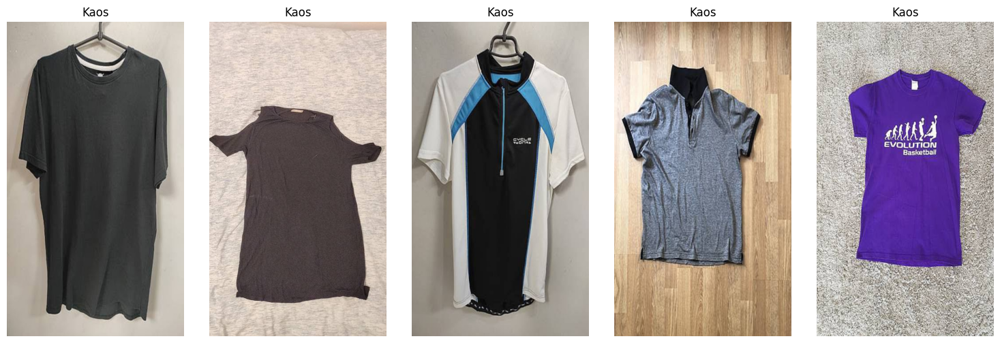

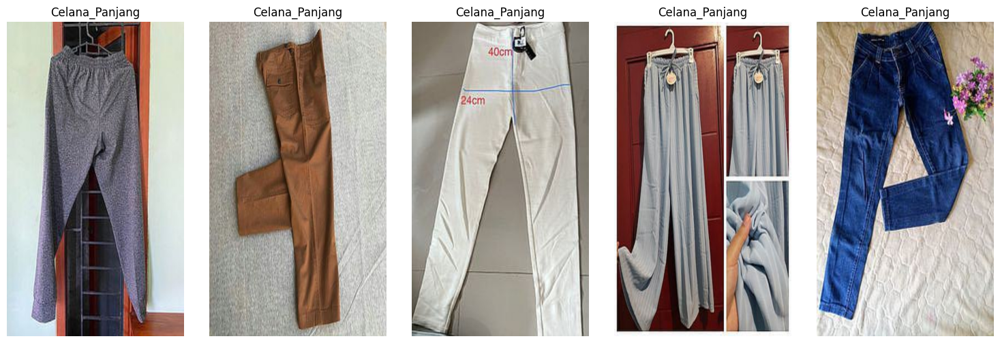

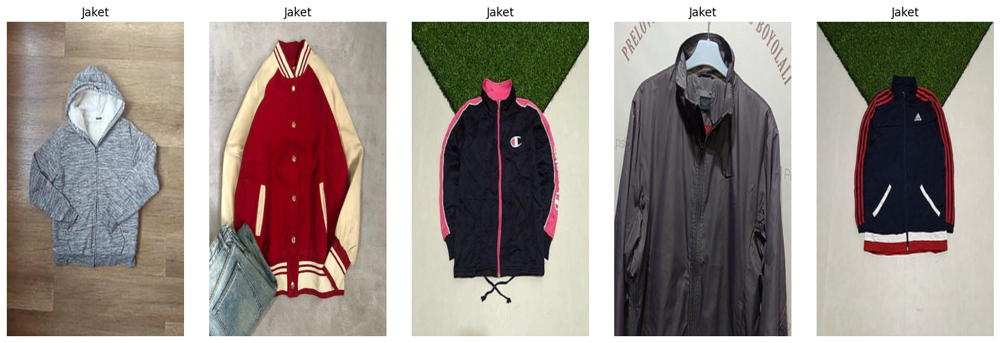

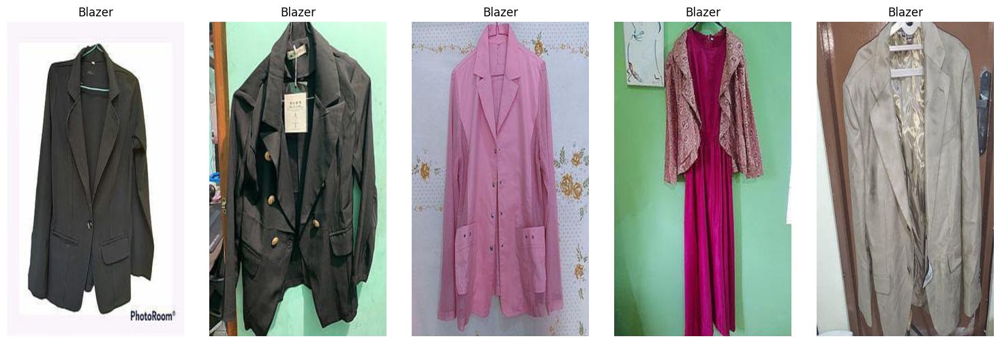

In [6]:
def display_images(class_name, num_images=5):
    class_dir = os.path.join(base_dir, class_name)
    images = os.listdir(class_dir)[:num_images]

    plt.figure(figsize=(15, 5))
    for i, img_name in enumerate(images):
        img_path = os.path.join(class_dir, img_name)
        img = Image.open(img_path)
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(class_name)
    plt.tight_layout()
    plt.show()

# Display images for each class
for class_name in clothes:
    display_images(class_name)

In [7]:
data=[]

for label in clothes:
    class_path=os.path.join(base_dir,label)
    for img_name in os.listdir(class_path):
        img_path=os.path.join(class_path,img_name)
        data.append({'image_path':img_path,'label':label})

data=pd.DataFrame(data)
data.head()

,image_path,label
0,/content/Clothes_Dataset/Hoodie/hoodie_fredper...,Hoodie
1,/content/Clothes_Dataset/Hoodie/hoodie_oioi_16...,Hoodie
2,/content/Clothes_Dataset/Hoodie/hoodie_peanuts...,Hoodie
3,/content/Clothes_Dataset/Hoodie/hoodie_carhart...,Hoodie
4,/content/Clothes_Dataset/Hoodie/hoodie_umbro_1...,Hoodie


In [8]:
data.shape

(7500, 2)

In [9]:
from sklearn.model_selection import train_test_split

train_data, temp_data = train_test_split(data, test_size=0.3, stratify=data['label'], random_state=42)
val_data, test_data = train_test_split(temp_data, test_size=0.4, stratify=temp_data['label'], random_state=42)

## Treinando a rede

Vou utilizar a rede EfficientNetB0

In [10]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

Realizando o pre-prococessamento nas imagens:

In [11]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define image size and batch size
IMG_SIZE = (299, 299)
BATCH_SIZE = 32

# Instantiate ImageDataGenerators
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Create generators from DataFrames
train_images = train_datagen.flow_from_dataframe(
    dataframe=train_data,
    x_col='image_path',  # Column with image paths
    y_col='label',       # Column with labels
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'  # Multi-class classification
)

val_images = val_test_datagen.flow_from_dataframe(
    dataframe=val_data,
    x_col='image_path',
    y_col='label',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_images = val_test_datagen.flow_from_dataframe(
    dataframe=test_data,
    x_col='image_path',
    y_col='label',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False  # Keep order for evaluation
)

Found 5250 validated image filenames belonging to 15 classes.
Found 1350 validated image filenames belonging to 15 classes.
Found 900 validated image filenames belonging to 15 classes.


Configurando o modelo:

In [12]:
from tensorflow.keras.optimizers import Adam

# Treinando a rede enquanto reaproveita os pesos pré treinados pelo dataset da imagenet
base_model = EfficientNetB7(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

x = GlobalAveragePooling2D()(base_model.output)
x = Dense(1024, activation='relu')(x)
predictions = Dense(len(clothes), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

258076736/258076736 ━━━━━━━━━━━━━━━━━━━━ 12s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 299, 299, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 299, 299, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 299, 299, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 299, 299, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 301, 301, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 150, 150, 64)   │          1,728 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 150, 150, 64)   │            256 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 150, 150, 64)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 150, 150, 64)   │            576 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 150, 150, 64)   │            256 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 150, 150, 64)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 64)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 64)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 16)       │          1,040 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand    

 Total params: 66,735,526 (254.58 MB)

 Trainable params: 66,424,799 (253.39 MB)

 Non-trainable params: 310,727 (1.19 MB)

Treinando o modelo:

In [13]:
from tensorflow.keras.callbacks import EarlyStopping

# Encerra o treinamento caso haja perda sobre os valores de validação
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    train_images,
    epochs=20,
    validation_data=val_images,
    callbacks=[early_stop]
)

Epoch 1/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 719s 3s/step - accuracy: 0.3365 - loss: 2.1142 - val_accuracy: 0.0696 - val_loss: 3.0820
Epoch 2/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 344s 2s/step - accuracy: 0.7548 - loss: 0.7589 - val_accuracy: 0.2800 - val_loss: 2.1964
Epoch 3/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 298s 2s/step - accuracy: 0.8437 - loss: 0.4745 - val_accuracy: 0.6600 - val_loss: 1.0228
Epoch 4/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 298s 2s/step - accuracy: 0.8930 - loss: 0.3243 - val_accuracy: 0.7778 - val_loss: 0.7795
Epoch 5/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 299s 2s/step - accuracy: 0.9141 - loss: 0.2628 - val_accuracy: 0.7911 - val_loss: 0.7692
Epoch 6/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 298s 2s/step - accuracy: 0.9410 - loss: 0.1765 - val_accuracy: 0.8022 - val_loss: 0.7315
Epoch 7/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 298s 2s/step - accuracy: 0.9481 - loss: 0.1553 - val_accuracy: 0.7556 - val_loss: 1.0088
Epoch 8/20
165/165 ━━━━━━━━━━━━━━━━━━━━ 299s 2s/step - accuracy: 0.9530 - loss: 0.1428 - val_accu

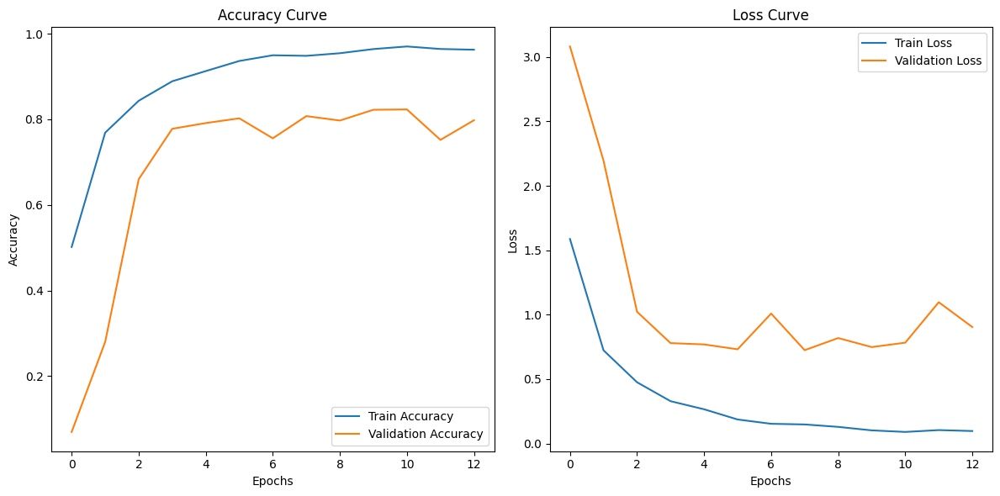

In [14]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Curve')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot the training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

## Testando o modelo

In [15]:
test_loss, test_accuracy = model.evaluate(test_images)
print(f"Test Accuracy: {test_accuracy:.2f}")

29/29 ━━━━━━━━━━━━━━━━━━━━ 24s 817ms/step - accuracy: 0.7513 - loss: 1.0002
Test Accuracy: 0.78


In [16]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

test_images.reset()
predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = test_images.classes
class_labels = list(test_images.class_indices.keys())

# Classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

29/29 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step
Classification Report:
                precision    recall  f1-score   support

        Blazer       0.69      0.70      0.69        60
Celana_Panjang       0.70      0.82      0.75        60
 Celana_Pendek       0.89      0.92      0.90        60
          Gaun       0.84      0.88      0.86        60
        Hoodie       0.81      0.87      0.84        60
         Jaket       0.53      0.65      0.58        60
   Jaket_Denim       0.90      0.78      0.84        60
Jaket_Olahraga       0.61      0.67      0.63        60
         Jeans       0.87      0.68      0.77        60
          Kaos       0.90      0.93      0.92        60
        Kemeja       0.75      0.82      0.78        60
        Mantel       0.85      0.68      0.76        60
          Polo       0.84      0.63      0.72        60
           Rok       0.89      0.85      0.87        60
        Sweter       0.80      0.85      0.82        60

      accuracy                          

Analisando a matriz de confusão:

<Axes: >

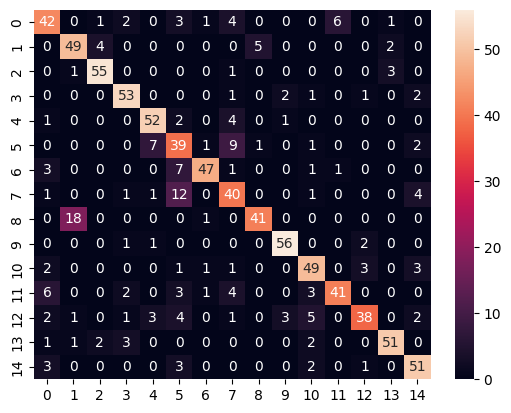

In [17]:
conf_matrix = confusion_matrix(true_classes, predicted_classes)
sns.heatmap(conf_matrix,annot=True,fmt='d')

## Salvando a rede no drive

Salvando as configurações podemos utilizar o código da segunda etapa sem a necessidade de passar por todo o processo de treinamento do modelo novamente.

In [18]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [19]:
drive_path = '/content/drive/MyDrive/EfficientNet'
if not os.path.exists(drive_path):
    os.makedirs(drive_path)

model.save_weights(os.path.join(drive_path, 'EfficientNetB7.weight.h5'))

# Ou utilize o seguinte codigo para salvar todo o modelo:
# model.save(os.path.join(drive_path, 'EfficientNetB7.h5'))

# Criando o sistema de busca

In [35]:
import requests
from PIL import Image
from io import BytesIO
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
import os

Pegando os resultados da etapa anterior para utiliza-los:

In [ ]:
# Caso você tenha optado por salvar o modelo anteriormente, basta utilizar
# esse comando ao invés da célula abaixo.
# model_path é o caminho para o arquivo onde você salvou o modelo.

# classificator = tf.keras.model.load_model(model_path)


In [85]:
# Recriando o modelo treinado
base_model = EfficientNetB7(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(1024, activation='relu')(x)
predictions = Dense(len(clothes), activation='softmax')(x)
classificator = Model(inputs=base_model.input, outputs=predictions)

# Carregando os pesos treinados
classificator.load_weights('/content/drive/MyDrive/EfficientNet/EfficientNetB7.weights.h5')

In [86]:
# Carregando um vetor com o nome das classes
clothes_class = open('clothes.txt', 'r').read().split('\n')
print(clothes_class)

['Jaket', 'Jaket_Olahraga', 'Celana_Panjang', 'Mantel', 'Rok', 'Polo', 'Blazer', 'Celana_Pendek', 'Jeans', 'Jaket_Denim', 'Kaos', 'Sweter', 'Gaun', 'Hoodie', 'Kemeja', '']


Algumas funções uteis para automatizar o processo de obtenção dos produtos:

In [80]:
def classification_image_by_url(image_url):
    # Obtendo e tratando a imagem para se tornar compativel ao modelo
    response = requests.get(image_url)
    img = Image.open(BytesIO(response.content))
    image = img.resize((299, 299))
    image = np.array(image)
    image = image / 255.0
    image = np.expand_dims(image, axis=0)

    # Realiza a previsão
    query = classificator.predict(image)
    predicted_label = np.argmax(query)

    return clothes_class[predicted_label]

def show_item(reponse, num):
    for i, item in enumerate(reponse[:num]):
        plt.imshow(Image.open(BytesIO(requests.get(item['thumbnail']).content)).resize((299, 299)))
        plt.axis('off')
        plt.title(item['title'] + '\nR$' + str(item['price']))
        plt.show()

Pegando uma imagem da internet para testar o sistema:

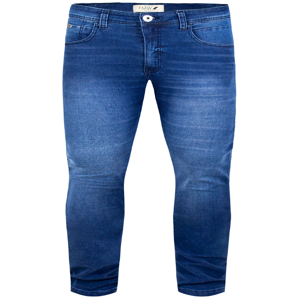

In [56]:
from IPython.display import display

image_for_test = "https://static.camisariafmw.com.br/produtograde/20230914115132_2540997460_GZ.jpg"
img = Image.open(BytesIO(requests.get(image_for_test).content))
img = img.resize((299, 299))
display(img)

Classificando a imagem e obtendo produtos semelhantes que estejam a venda no Mercado Livre>

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


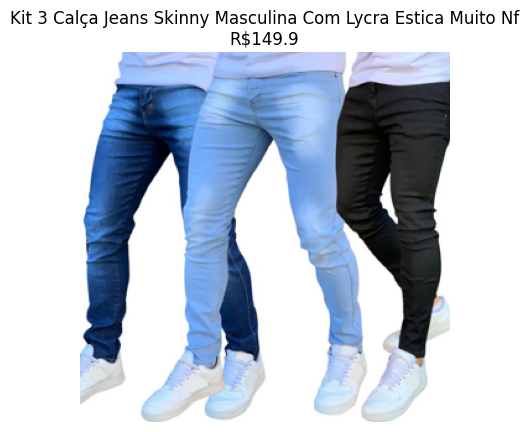

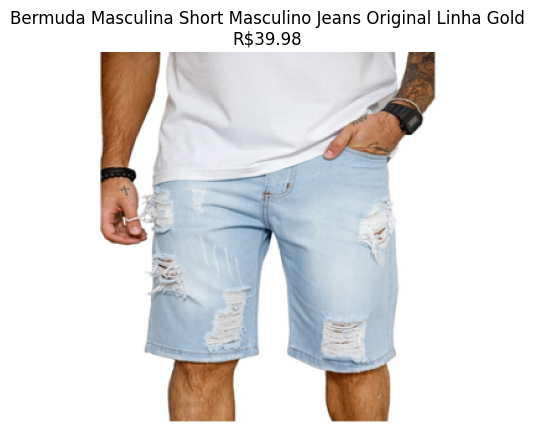

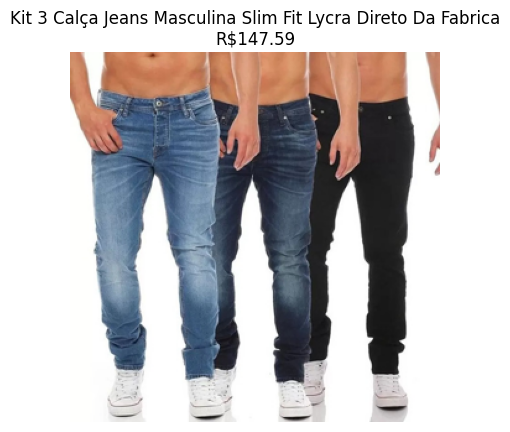

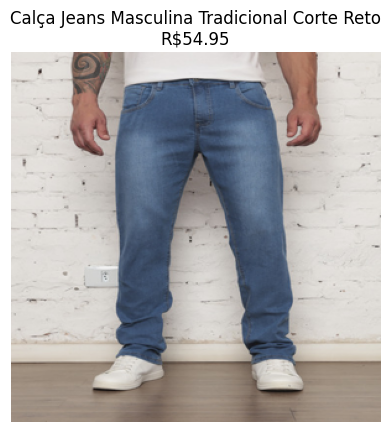

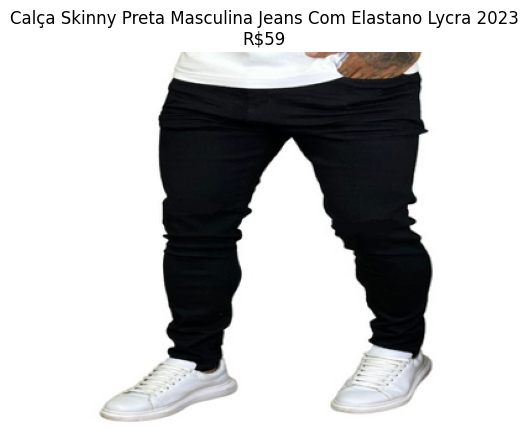

In [81]:
# Classificando a imagem acima
query = classification_image_by_url(image_for_test)

# Realizando a requisição ao Mercado Livre utilizando a categoria de Roupas e Acessórios
url = f"https://api.mercadolibre.com/sites/MLB/search?q={query}&category=MLB1430"
response = requests.get(url).json().get('results')

# Mostrando os 5 primeiros produtos encontrados
num_items = 5 if len(response) > 5 else len(response)
show_item(response, num_items)